In [ ]:
# Data Preprocessing
#Data loading
import pandas as pd

csv_file_path = '/content/fraudTrain.csv.zip'

df = pd.read_csv(csv_file_path)

df.head()


,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [ ]:
#Data Cleaning
df = df.drop_duplicates() # here removed duplicate rows
df = df.dropna() # here removed nullvalues NA
cleaned_file_name = 'cleaned_file.csv'

df.to_csv(cleaned_file_name, index=False)
print(df)
df.info()



         Unnamed: 0 trans_date_trans_time               cc_num  \
0                 0   2019-01-01 00:00:18     2703186189652095   
1                 1   2019-01-01 00:00:44         630423337322   
2                 2   2019-01-01 00:00:51       38859492057661   
3                 3   2019-01-01 00:01:16     3534093764340240   
4                 4   2019-01-01 00:03:06      375534208663984   
...             ...                   ...                  ...   
1296670     1296670   2020-06-21 12:12:08       30263540414123   
1296671     1296671   2020-06-21 12:12:19     6011149206456997   
1296672     1296672   2020-06-21 12:12:32     3514865930894695   
1296673     1296673   2020-06-21 12:13:36     2720012583106919   
1296674     1296674   2020-06-21 12:13:37  4292902571056973207   

                                    merchant       category     amt  \
0                 fraud_Rippin, Kub and Mann       misc_net    4.97   
1            fraud_Heller, Gutmann and Zieme    grocery_pos  107.

In [ ]:

import pandas as pd
import numpy as np

file_path = 'cleaned_file.csv'
data = pd.read_csv(file_path)

column_name = 'is_fraud' # here we given is_fraud

column_data = data[column_name]

Q1 = np.percentile(column_data, 25)
Q3 = np.percentile(column_data, 75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = column_data[(column_data < lower_bound) | (column_data > upper_bound)]

print("Outliers in '{}' column:".format(column_name))
print(outliers)


Outliers in 'is_fraud' column:
2449       1
2472       1
2523       1
2546       1
2553       1
          ..
1295399    1
1295491    1
1295532    1
1295666    1
1295733    1
Name: is_fraud, Length: 7506, dtype: int64


In [ ]:
#visualization
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = 'cleaned_file.csv'
data = pd.read_csv(file_path)

print(data.describe())

print(data.head())


         Unnamed: 0        cc_num           amt           zip           lat  \
count  1.296675e+06  1.296675e+06  1.296675e+06  1.296675e+06  1.296675e+06   
mean   6.483370e+05  4.171920e+17  7.035104e+01  4.880067e+04  3.853762e+01   
std    3.743180e+05  1.308806e+18  1.603160e+02  2.689322e+04  5.075808e+00   
min    0.000000e+00  6.041621e+10  1.000000e+00  1.257000e+03  2.002710e+01   
25%    3.241685e+05  1.800429e+14  9.650000e+00  2.623700e+04  3.462050e+01   
50%    6.483370e+05  3.521417e+15  4.752000e+01  4.817400e+04  3.935430e+01   
75%    9.725055e+05  4.642255e+15  8.314000e+01  7.204200e+04  4.194040e+01   
max    1.296674e+06  4.992346e+18  2.894890e+04  9.978300e+04  6.669330e+01   

               long      city_pop     unix_time     merch_lat    merch_long  \
count  1.296675e+06  1.296675e+06  1.296675e+06  1.296675e+06  1.296675e+06   
mean  -9.022634e+01  8.882444e+04  1.349244e+09  3.853734e+01 -9.022646e+01   
std    1.375908e+01  3.019564e+05  1.284128e+07  5.

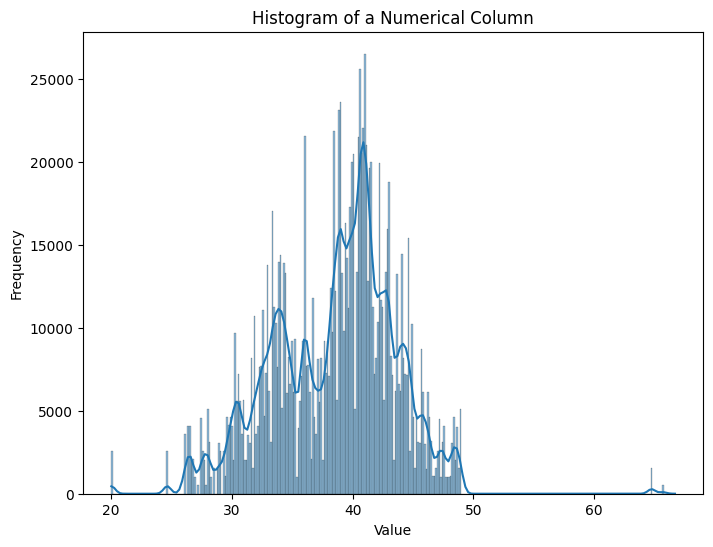

In [ ]:
#creating Histogram
plt.figure(figsize=(8, 6))
sns.histplot(data['lat'], kde=True)
plt.title('Histogram of a Numerical Column')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()


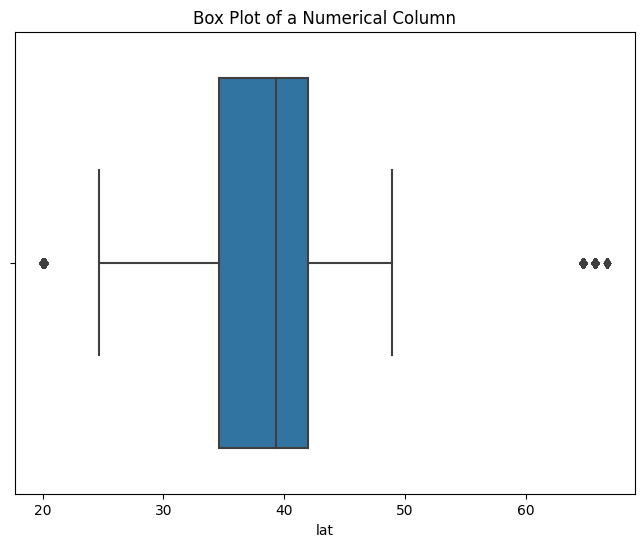

In [ ]:
#Box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['lat'])
plt.title('Box Plot of a Numerical Column')
plt.show()


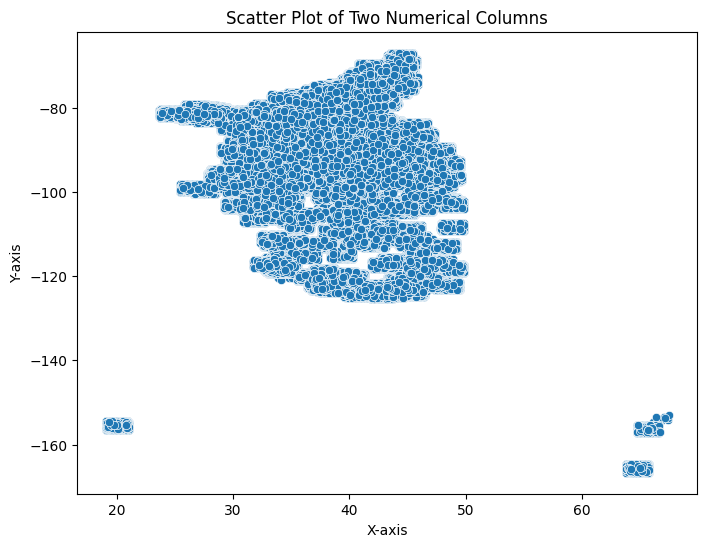

In [ ]:
#Scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['merch_lat'], y=data['merch_long'])
plt.title('Scatter Plot of Two Numerical Columns')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.show()


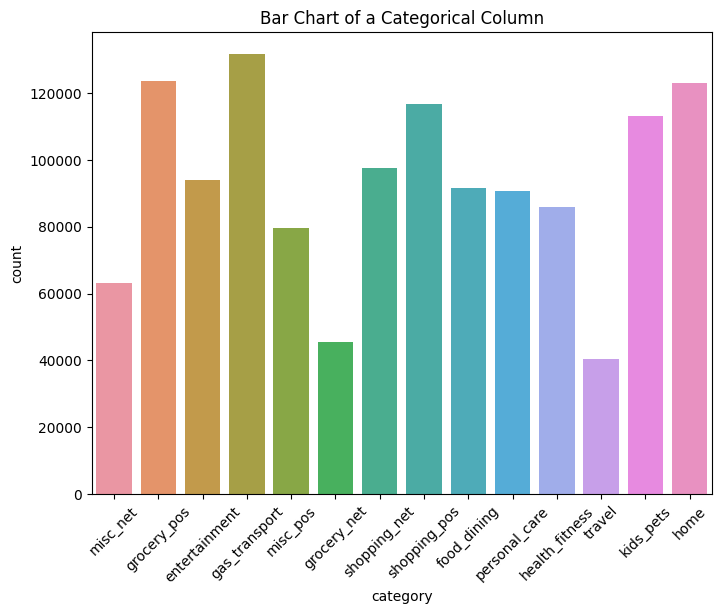

In [ ]:
#Bar chart
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='category')
plt.title('Bar Chart of a Categorical Column')
plt.xticks(rotation=45)
plt.show()


<ipython-input-32-81f071d4d7a4>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap='coolwarm', linewidths=0.5)


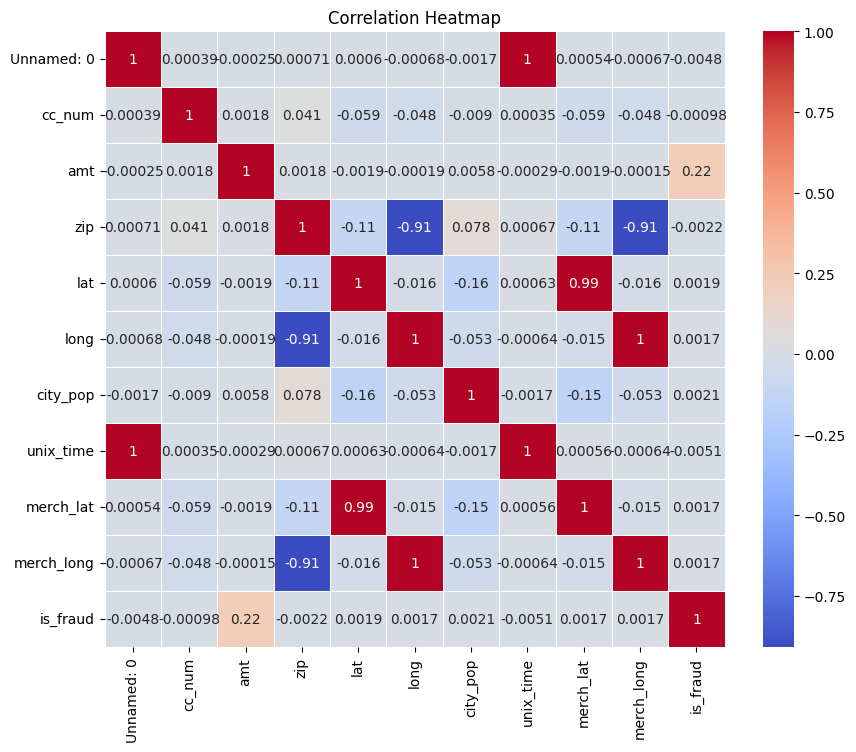

In [ ]:
#Corelation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


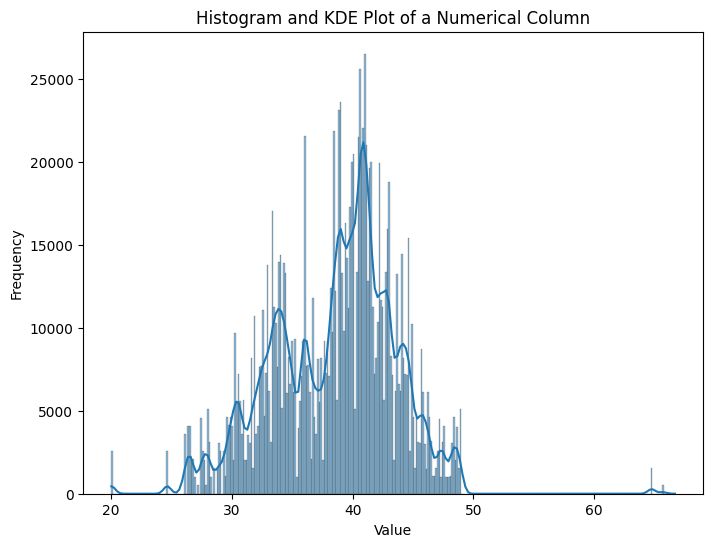

In [ ]:
#Statistical Analysis for my numerical coloumns

import seaborn as sns
import matplotlib.pyplot as plt

numerical_column = data['lat']

plt.figure(figsize=(8, 6))
sns.histplot(numerical_column, kde=True)
plt.title('Histogram and KDE Plot of a Numerical Column')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()


In [ ]:
#Central Tendency
mean_value = numerical_column.mean()
median_value = numerical_column.median()
mode_value = numerical_column.mode().values[0]
print("Mean:", mean_value)
print("Median:", median_value)
print("Mode:", mode_value)


Mean: 38.53762161489965
Median: 39.3543
Mode: 36.385


In [ ]:
#Hypothesis Testing
from scipy import stats

sample_data = df['lat']

hypothesized_mean = 50

t_stat, p_value = stats.ttest_1samp(sample_data, hypothesized_mean)
print("t-statistic:", t_stat)
print("p-value:", p_value)



t-statistic: -2571.491459544005
p-value: 0.0


In [ ]:
#Z score
from scipy import stats
z_scores = stats.zscore(df['lat'])
specific_z_score = z_scores[5]
print("Z-Scores:")
print(z_scores)


Z-Scores:
0         -0.484420
1          2.039120
2          0.717754
3          1.515617
4         -0.023035
             ...   
1296670   -0.161575
1296671    0.143638
1296672   -1.102883
1296673    0.948613
1296674    1.439314
Name: lat, Length: 1296675, dtype: float64


In [ ]:
#for AutoEda
!pip install pandas-profiling


In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     | 17.8 MB 24.7 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357555 sha256=7b670c585ce58c6c40bc540d74df0b651c1e4d54edc0739f11b5fefafe276d4e
  Stored in directory: /tmp/pip-ephem-wheel-cache-npzmgrix/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
Successfully built ydata-profiling
  Attempting uninstall: ydata-profiling
    Found existing installation: ydata-profiling 4.6.1
    Uninstalling ydata-profiling-4.6.1:
      Successfully uninstalled ydata-profiling-4.6.1


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
%matplotlib inline
pd.set_option('display.max_colwidth', None)

In [ ]:
file_path = 'cleaned_file.csv'
df = pd.read_csv(file_path)


In [ ]:
profile = ProfileReport(df, title='Credit_card data', explorative=True)



In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file('Credit Data.html')

In [ ]:
# Assuming 'trans_date_trans_time' is your datetime feature
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df['hour'] = df['trans_date_trans_time'].dt.hour  # Extract hour
df['day'] = df['trans_date_trans_time'].dt.day    # Extract day
df['month'] = df['trans_date_trans_time'].dt.month  # Extract month

# Drop the original datetime column
df = df.drop('trans_date_trans_time', axis=1)


In [ ]:
print(df.isnull().sum())


Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64


In [ ]:
non_numeric_columns = df.select_dtypes(exclude=['number']).columns
print("Non-numeric columns:", non_numeric_columns)


Non-numeric columns: Index(['trans_date_trans_time', 'merchant', 'category', 'first', 'last',
       'gender', 'street', 'city', 'state', 'job', 'dob', 'trans_num'],
      dtype='object')


In [ ]:
non_relevant_columns = ['merchant', 'category', 'first', 'last', 'gender', 'street', 'city', 'state', 'job', 'dob', 'trans_num']
df = df.drop(non_relevant_columns, axis=1)


In [ ]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df['hour'] = df['trans_date_trans_time'].dt.hour
df['day'] = df['trans_date_trans_time'].dt.day
df['month'] = df['trans_date_trans_time'].dt.month
df = df.drop('trans_date_trans_time', axis=1)


In [ ]:
# Assuming 'trans_date_trans_time' is your datetime feature
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'], errors='coerce')

# Extract relevant information
df['hour'] = df['trans_date_trans_time'].dt.hour
df['day'] = df['trans_date_trans_time'].dt.day
df['month'] = df['trans_date_trans_time'].dt.month

# Drop the original datetime column
df = df.drop('trans_date_trans_time', axis=1)

# Drop rows with missing values (if any)
df = df.dropna()

# Check if the issue is resolved
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 25 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Unnamed: 0  1296675 non-null  int64  
 1   cc_num      1296675 non-null  int64  
 2   merchant    1296675 non-null  object 
 3   category    1296675 non-null  object 
 4   amt         1296675 non-null  float64
 5   first       1296675 non-null  object 
 6   last        1296675 non-null  object 
 7   gender      1296675 non-null  object 
 8   street      1296675 non-null  object 
 9   city        1296675 non-null  object 
 10  state       1296675 non-null  object 
 11  zip         1296675 non-null  int64  
 12  lat         1296675 non-null  float64
 13  long        1296675 non-null  float64
 14  city_pop    1296675 non-null  int64  
 15  job         1296675 non-null  object 
 16  dob         1296675 non-null  object 
 17  trans_num   1296675 non-null  object 
 18  unix_time   1296675 no

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle




In [ ]:
#1 RandomForest
train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)


train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)

# We used one hot encoder
encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()

# Feature scaling
scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

model = RandomForestClassifier(random_state=42)


model.fit(X_train[::250000], y_train[::250000])

y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))





Confusion Matrix:
 [[553574      0]
 [  2145      0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       1.00      0.00      0.00      2145

    accuracy                           1.00    555719
   macro avg       1.00      0.50      0.50    555719
weighted avg       1.00      1.00      0.99    555719


Accuracy Score: 0.9961401355721147


In [ ]:

smote = SMOTE(random_state=36)

x_train_resample, y_train_resample = smote.fit_resample(final_train_features, train_target)
print('Current length of the training set: ', len(y_train_resample))

Current length of the training set:  2578338


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
#2 Logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)


encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()
scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']


X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)


model = LogisticRegression(random_state=42)
model.fit(X_train[::20000], y_train[::20000])


y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))



Confusion Matrix:
 [[553574      0]
 [  2145      0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       1.00      0.00      0.00      2145

    accuracy                           1.00    555719
   macro avg       1.00      0.50      0.50    555719
weighted avg       1.00      1.00      0.99    555719


Accuracy Score: 0.9961401355721147


In [ ]:
#3 SVM
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd


train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)


encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()


scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']


X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)


model = SVC(kernel='linear', random_state=42)
model.fit(X_train[::20000], y_train[::20000])

y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))


Confusion Matrix:
 [[553574      0]
 [  2145      0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       1.00      0.00      0.00      2145

    accuracy                           1.00    555719
   macro avg       1.00      0.50      0.50    555719
weighted avg       1.00      1.00      0.99    555719


Accuracy Score: 0.9961401355721147


In [ ]:
# 4 Decision Trees
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)

# One-hot encoding
encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()

# Feature scaling
scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))


Confusion Matrix:
 [[547773   5801]
 [   793   1352]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99    553574
           1       0.19      0.63      0.29      2145

    accuracy                           0.99    555719
   macro avg       0.59      0.81      0.64    555719
weighted avg       1.00      0.99      0.99    555719


Accuracy Score: 0.9881342908916196


In [ ]:
#5KNN

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)


train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)


encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()


scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']


X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

k = 5
model = KNeighborsClassifier(n_neighbors=k)
model.fit(X_train[::100000], y_train[::100000])


y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))


Confusion Matrix:
 [[553574      0]
 [  2145      0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       1.00      0.00      0.00      2145

    accuracy                           1.00    555719
   macro avg       1.00      0.50      0.50    555719
weighted avg       1.00      1.00      0.99    555719


Accuracy Score: 0.9961401355721147


In [ ]:
#6 Naive Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)

encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()

scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

model = GaussianNB()
model.fit(X_train, y_train)


y_pred = model.predict(final_test_features)

print("Confusion Matrix:\n", confusion_matrix(test_target, y_pred))
print("\nClassification Report:\n", classification_report(test_target, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(test_target, y_pred))


Confusion Matrix:
 [[534726  18848]
 [  1230    915]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.05      0.43      0.08      2145

    accuracy                           0.96    555719
   macro avg       0.52      0.70      0.53    555719
weighted avg       0.99      0.96      0.98    555719


Accuracy Score: 0.9638702293785169


In [ ]:
#7 Neural Networks
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)

encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()


scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)


model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose=1)

y_pred_proba = model.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)


print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))


Epoch 1/10
32417/32417 [==============================] - 109s 3ms/step - loss: 0.0171 - accuracy: 0.9958 - val_loss: 0.0138 - val_accuracy: 0.9963
Epoch 2/10
32417/32417 [==============================] - 100s 3ms/step - loss: 0.0123 - accuracy: 0.9966 - val_loss: 0.0111 - val_accuracy: 0.9966
Epoch 3/10
32417/32417 [==============================] - 99s 3ms/step - loss: 0.0108 - accuracy: 0.9969 - val_loss: 0.0102 - val_accuracy: 0.9968
Epoch 4/10
32417/32417 [==============================] - 101s 3ms/step - loss: 0.0105 - accuracy: 0.9970 - val_loss: 0.0100 - val_accuracy: 0.9971
Epoch 5/10
32417/32417 [==============================] - 102s 3ms/step - loss: 0.0102 - accuracy: 0.9971 - val_loss: 0.0105 - val_accuracy: 0.9970
Epoch 6/10
32417/32417 [==============================] - 93s 3ms/step - loss: 0.0101 - accuracy: 0.9971 - val_loss: 0.0101 - val_accuracy: 0.9970
Epoch 7/10
32417/32417 [==============================] - 100s 3ms/step - loss: 0.0099 - accuracy: 0.9971 - val_lo

In [ ]:
#8 Linear Discriminant Analysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)

encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()

scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

model = LinearDiscriminantAnalysis()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)


print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))





Confusion Matrix:
 [[256109   1706]
 [   777    743]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00    257815
           1       0.30      0.49      0.37      1520

    accuracy                           0.99    259335
   macro avg       0.65      0.74      0.68    259335
weighted avg       0.99      0.99      0.99    259335


Accuracy Score: 0.9904255114041683


In [ ]:
#9 Quadratic Discriminant Analysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd

train_path = '/content/cleaned_file.csv'
test_path = '/content/fraudTest.csv.zip'

train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)


train_data['trans_date_trans_time'] = pd.to_datetime(train_data['trans_date_trans_time'], errors='coerce')
test_data['trans_date_trans_time'] = pd.to_datetime(test_data['trans_date_trans_time'], errors='coerce')

train_data['hour'] = train_data['trans_date_trans_time'].dt.hour
train_data['day'] = train_data['trans_date_trans_time'].dt.day
train_data['month'] = train_data['trans_date_trans_time'].dt.month

test_data['hour'] = test_data['trans_date_trans_time'].dt.hour
test_data['day'] = test_data['trans_date_trans_time'].dt.day
test_data['month'] = test_data['trans_date_trans_time'].dt.month

train_data = train_data.drop('trans_date_trans_time', axis=1)
test_data = test_data.drop('trans_date_trans_time', axis=1)


encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_train_features = encoder.fit_transform(train_data[categorical_cols]).toarray()
encoded_test_features = encoder.transform(test_data[categorical_cols]).toarray()


scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_train_features = scaler.fit_transform(train_data[numerical_cols])
scaled_test_features = scaler.transform(test_data[numerical_cols])

final_train_features = pd.concat([pd.DataFrame(encoded_train_features), pd.DataFrame(scaled_train_features)], axis=1)
final_test_features = pd.concat([pd.DataFrame(encoded_test_features), pd.DataFrame(scaled_test_features)], axis=1)

train_target = train_data['is_fraud']
test_target = test_data['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(final_train_features, train_target, test_size=0.2, random_state=42)

model = QuadraticDiscriminantAnalysis()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, zero_division=1))
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Confusion Matrix:
 [[257024    791]
 [  1476     44]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00    257815
           1       0.05      0.03      0.04      1520

    accuracy                           0.99    259335
   macro avg       0.52      0.51      0.52    259335
weighted avg       0.99      0.99      0.99    259335


Accuracy Score: 0.9912584109356624


In [ ]:
#Cross Validation using K-Fold
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import cross_val_predict, cross_val_score, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import pandas as pd


file_path = '/content/cleaned_file.csv'
df = pd.read_csv(file_path)

df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'], errors='coerce')
df['hour'] = df['trans_date_trans_time'].dt.hour
df['day'] = df['trans_date_trans_time'].dt.day
df['month'] = df['trans_date_trans_time'].dt.month

df = df.drop('trans_date_trans_time', axis=1)

encoder = OneHotEncoder(drop='first')
categorical_cols = ['gender', 'category', 'state']
encoded_features = encoder.fit_transform(df[categorical_cols]).toarray()

scaler = StandardScaler()
numerical_cols = ['amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long']
scaled_features = scaler.fit_transform(df[numerical_cols])

final_features = pd.concat([pd.DataFrame(encoded_features), pd.DataFrame(scaled_features)], axis=1)

target = df['is_fraud']

model = QuadraticDiscriminantAnalysis()

kf = KFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_val_score(model, final_features, target, cv=kf, scoring='accuracy')


print("Cross-Validation Results:")
print("Accuracy Scores:", cv_results)
print("Mean Accuracy:", cv_results.mean())

y_pred_cv = cross_val_predict(model, final_features, target, cv=kf)

print("\nConfusion Matrix:\n", confusion_matrix(target, y_pred_cv))
print("\nClassification Report:\n", classification_report(target, y_pred_cv, zero_division=1))
print("\nAccuracy Score:", accuracy_score(target, y_pred_cv))


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Cross-Validation Results:
Accuracy Scores: [0.99113887 0.99089595 0.99212601 0.9911543  0.99172884]
Mean Accuracy: 0.9914087955732933


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")



Confusion Matrix:
 [[1285182    3987]
 [   7153     353]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00   1289169
           1       0.08      0.05      0.06      7506

    accuracy                           0.99   1296675
   macro avg       0.54      0.52      0.53   1296675
weighted avg       0.99      0.99      0.99   1296675


Accuracy Score: 0.9914087955732932


In [ ]:
import numpy as np
correlation_matrix = df.corr().abs()

upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))

to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop the highly correlated features
df = df.drop(to_drop, axis=1)


<ipython-input-3-c3649f4cd211>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr().abs()
<ipython-input-3-c3649f4cd211>:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))


In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
final_features_pca = pca.fit_transform(final_features)


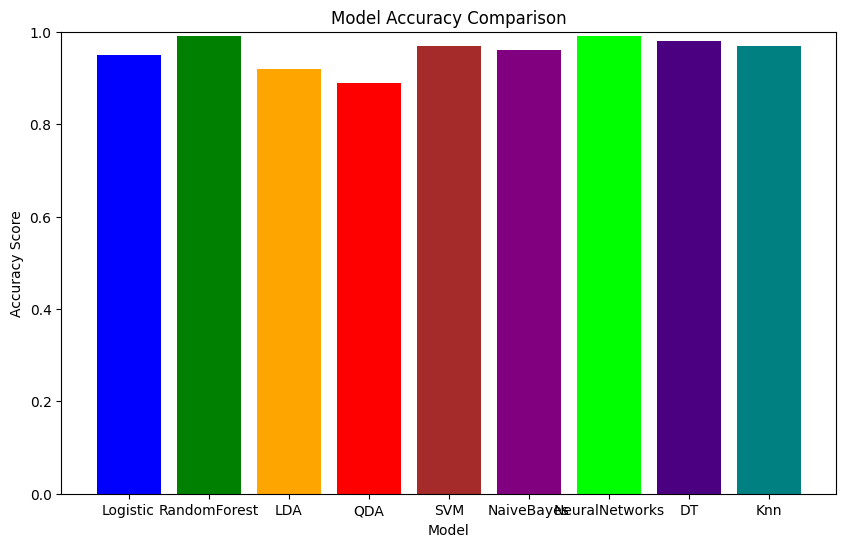

In [ ]:
#Graphs on model accuracy comparisons
import matplotlib.pyplot as plt
import numpy as np

accuracy_scores = {
    'Logistic': 0.95,
    'RandomForest': 0.99,
    'LDA': 0.92,
    'QDA': 0.89,
    'SVM': 0.97,
    'NaiveBayes': 0.96,
    'NeuralNetworks': 0.99,
    'DT': 0.98,
    'Knn': 0.97

}

models = list(accuracy_scores.keys())
scores = list(accuracy_scores.values())

plt.figure(figsize=(10, 6))
plt.bar(models, scores, color=['blue', 'green', 'orange', 'red','brown','purple','lime','indigo','teal'])  # Adjust colors as needed
plt.xlabel('Model')
plt.ylabel('Accuracy Score')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 1)
plt.show()



In [ ]:
#The finalised Model is neuralnetworks

In [ ]:
#Deployment
